# Objective

The objective of this notebook is to show how to calculate and use the Discrete Cosine Transform to analyze pictures.

## 0. Dependencies

The Discrete Cosine Transform (DCT) is to the image processing what the Fourier Series is to signals.  <br>
This transform is able to decompose an image into a sum of cosines. By setting the maximum mode to capture, one can use this algorithm to compress the content of an image. In fact, this algorithm is commonly used for JPEG compression.

This notebook wants to show the usage of Discrete Cosine Transform for Image Compression. Scipy has a very good implementation of it, but I believe it is a good practice to code it on one's own before switching to preconfectioned routines (although they're 99% of the time more efficient). <br>
First of all, we import the dependencies

In [1]:
import PIL
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
#opencv is the only package which is not included in the standard anaconda installer. 
#Please refer to https://opencv.org/ for information
import cv2


This is pretty much all you need since we are going to implement the DCT from scratch.

## 1. DCT Fundamentals

Given an Image $I_{mn}$, the DCT maps $I_{mn}$ to a $D_{pq}$ where $$ 0 \le m \le M-1 $$ $$ 0 \le n \le N-1 $$
<br>
$D_{pq}$, the mapped image, lives in a different space than $I_{mn}$ but its size is consistent with that of the original image. Therefore <br> $$ 0 \le p \le M-1 $$ $$ 0 \le q \le N-1 $$ <br>



the mapped image can be written as a sum of cosines.
$$D_{pq} = \sum_{m=0}^{M-1}\sum_{n=0}^{N-1}I_{mn}c_{p} c_{q}cos\left(\frac{\pi(2m+1)p}{2M}\right)cos\left(\frac{\pi(2n+1)q}{2N}\right)$$ 

The terms $c_p$ and $c_q$ represent some coefficients which are easily calculated as: <br>
$$
    c(x)= 
\begin{cases}
    \frac{1}{\sqrt T},& \text{if } x = 0\\
    \sqrt \frac{2}{T},              & \text{otherwise}
\end{cases}
$$
$T$ is either $M$ or $N$ depending on whether $c_p$ or $c_q$ are considered.

Another important element of the DCT is the definition of <i>basis functions </i>. <br>
The basis functions can be interpreted as the fundamental components of the picture whereas the DCT coefficients represent the weights, or the "energy", contained in a certain mode.<br>
The basis functions can be calculated as:
$$ \Phi_{pq} = c_{p} c_{q}cos\left(\frac{\pi(2m+1)p}{2M}\right)cos\left(\frac{\pi(2n+1)q}{2N}\right) $$

It becomes evident that the DCT coefficient are the coefficients of the projection of the Image $I_{mn}$ onto the vector space defined by the basis functions. <br>
Let's now write down the code to get a better feeling of this algorithm.

## 2. Image Preparation

Let's read the image of my cat, Tweety, using Image.open from PIL.

In [2]:
image = Image.open("IMG_8659.jpg")

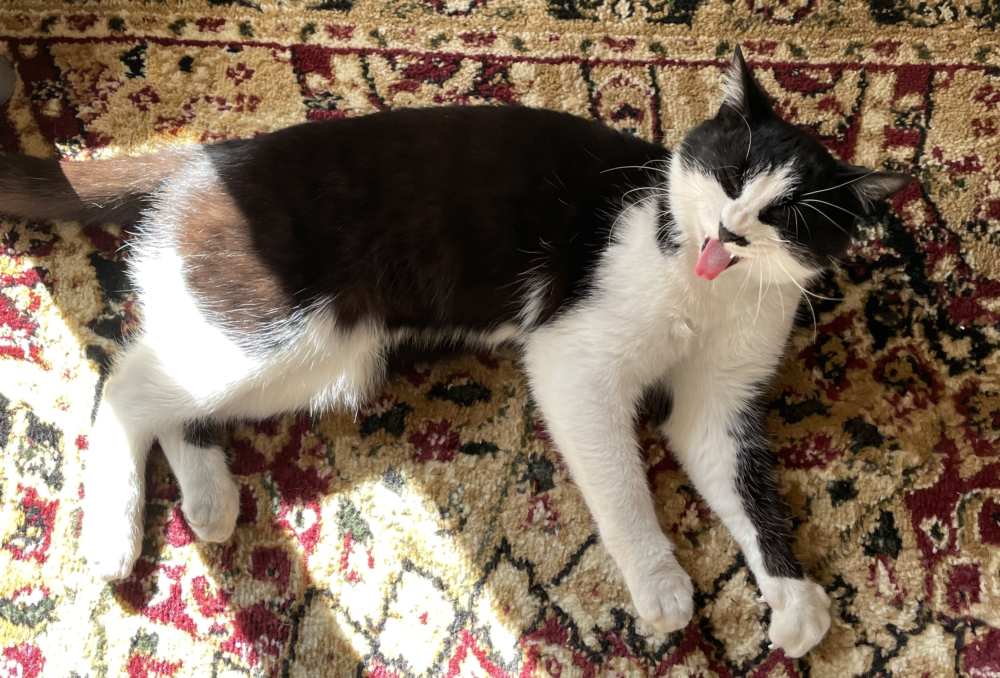

In [3]:
image

This image is rather large. So we are going to cast it to a numpy array, crop the area corresponding to the head and reshape to a 256x256 array. Then cast to a float16 array. In addition, let's just work on the red channel of the picture. The same procedure can be easily applied to all the three channels

(-0.5, 255.5, 255.5, -0.5)

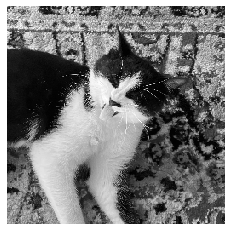

In [4]:
img = np.array(image)[:1500,-1500:,:]
img = cv2.resize(img,(256,256))
img = img.astype(np.float32)[:,:,0]
plt.imshow(img,cmap="gray")
plt.axis("off")

## 3. DCT coefficients and Basis Functions Calculation

Let's now define the function for the calculation of $c_p$ and $c_q$ in $$D_{pq} = \sum_{m=0}^{M-1}\sum_{n=0}^{N-1}I_{mn}c_{p} c_{q}cos\left(\frac{\pi(2m+1)p}{2M}\right)cos\left(\frac{\pi(2n+1)q}{2N}\right)$$ 

In [5]:
def c(p,M):
    #support function for the DCT
    if p == 0:
        return 1/np.sqrt(M)
    else:
        return np.sqrt(2/M)

Generate an empty array to contain the DCT coefficient $D_{pq}$

In [6]:
D = np.zeros_like(img)
M = D.shape[0]
N = D.shape[1]

The vectorized implementation takes advantage of python's <i>broadcasting</i> feature. In reality, this could be done avoiding even the loops over p and q, but that would affect the readability. Since our objective is understanding, we will prioritize readability over speed.

In [7]:
mv_vector = np.arange(M).reshape(-1,1)
nv_vector = np.arange(N).reshape(1,-1)

for p in range(M):
    for q in range(N):
        D[p,q] = c(p,M)*c(q,N)*np.sum(img*np.cos((np.pi*(2*mv_vector+1)*p)/(2*M))*np.cos((np.pi*(2*nv_vector+1)*q)/(2*N)))

The basis function, as previously stated, will be calculated as follows.
$$ \Phi_{pq} = c_{p} c_{q}cos\left(\frac{\pi(2m+1)p}{2M}\right)cos\left(\frac{\pi(2n+1)q}{2N}\right) $$

In [8]:
BasisFunction = np.zeros((M,N,M,N))
for p in range(M):
    for q in range(N):
        BasisFunction[p,q] = c(p,M)*c(q,N)*np.cos((np.pi*(2*mv_vector+1)*p)/(2*M))*np.cos((np.pi*(2*nv_vector+1)*q)/(2*N))

The basis function matrix is a 256x256 matrix containing 256x256 pictures. Let's visualize the first 25 basis functions (5x5).

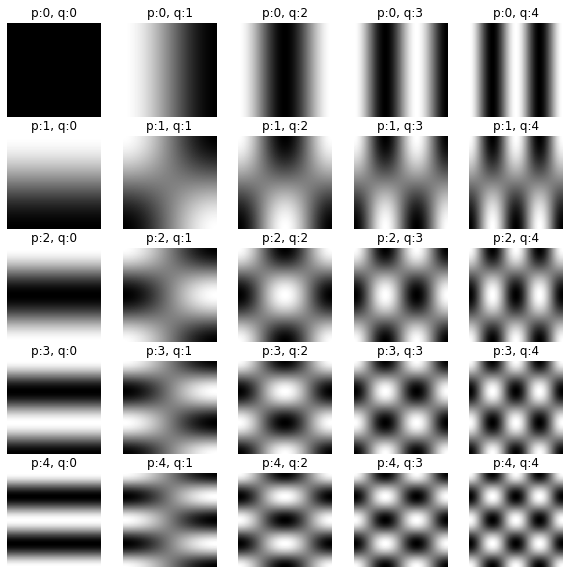

In [9]:
fig, axs = plt.subplots(5,5,figsize=(10,10))
for i in range(5):
    for j in range(5):
        axs[i][j].imshow(BasisFunction[i,j],cmap="gray")
        axs[i][j].axis("off")
        axs[i][j].set_title(f"p:{i}, q:{j}")

It is clear that higher $p$ and $q$ correspond to higher frequency components. <br>
The original picture can then be reconstructed as a linear combination of basis functions. <br>
It is important to notice that the basis functions <i> do not </i> depend on the picture content but only on its size. The reconstructed picture can be easily calculated as:

In [10]:
upTo = 50
reconstructedImage = np.zeros((M,N))
for i in range(upTo):
    for j in range(upTo):
        reconstructedImage += D[i,j]*BasisFunction[i,j]

(-0.5, 255.5, 255.5, -0.5)

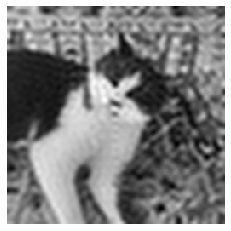

In [11]:
plt.imshow(reconstructedImage,cmap="gray")
plt.axis("off")

Given that a 256x256 picture has a total of $256^2=65536$ basis functions, a $50^2=2500$ only uses 3.8% of that, and nevertheless its content is retained. Why?

Let's now visually examine how the quality of the picture changes for different number of basis used.

(-0.5, 255.5, 255.5, -0.5)

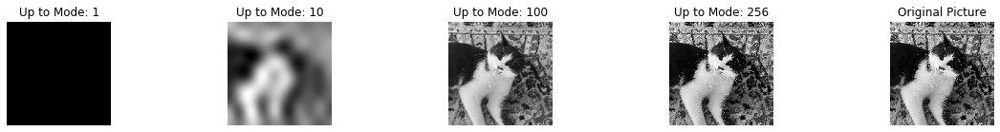

In [12]:
fig,axs=plt.subplots(1,5,figsize=(20,2))
modes = [1,10,100,256]
for n,mode in enumerate(modes):
    reconstructedImage = np.zeros((M,N))
    for i in range(mode):
        for j in range(mode):
            reconstructedImage += D[i,j]*BasisFunction[i,j]
    axs[n].imshow(reconstructedImage,cmap="gray")
    axs[n].set_title(f"Up to Mode: {str(mode)}")
    axs[n].axis("off")
    
axs[-1].imshow(img,cmap="gray")
axs[-1].set_title(f"Original Picture")
axs[-1].axis("off")

## 4. How much content of the original picture has been retained?

If you are familiar with the Principal Component Analysis (PCA) you will probably find this explanation somewhat similar to that of the <i> explained variance ratio </i>. <br>
In order to understand how much variance of the original picture the reconstructed picture is retaining, you can calculate a ratio of the sum of the DCT coefficients up to a certain mode divided by the total sum of the coefficients. In other words:
$$ \sigma = \frac{\sum_{p=0}^{K}\sum_{q=0}^{L}|D_{pq}|}{\sum_{p=0}^{M-1}\sum_{q=0}^{N-1}|D_{pq}|}$$ <br>
where:
$$ 0 \lt K \le M-1 $$
$$ 0 \lt L \le N-1 $$

If $\sigma=1$, all content is retained and the reconstruction was non-lossy. On the other hand, if $\sigma<1$, the compression is lossy and it is up to you deciding whether this is negligible. For the 4 pictures above, sigmas are, respectively:

In [19]:
for mode in modes:
    print(f"Up to mode: {mode}, sigma is {np.sum(np.abs(D[:mode,:mode]))/np.sum(np.abs(D[:,:]))} ")

Up to mode: 1, sigma is 0.01721433736383915 
Up to mode: 10, sigma is 0.07611183077096939 
Up to mode: 100, sigma is 0.43664222955703735 
Up to mode: 256, sigma is 1.0 


This shows that only by using all the modes can the reconstruction be considered non-lossy. On the other hand, using a lower number of modes will cause some high-frequency loss. <br>
However, there is one case where DCT mode-clipping is extremely useful: high-frequency noise in the source picture. In this case, clipping some nodes may have an effect similar to that of the low-pass filter known as [Gaussian Blur](https://en.wikipedia.org/wiki/Gaussian_blur)